# Question Formulation
> _You should refine the question formulation based on the general task description you’ve been given, ie, predicting flight delays. This should include some discussion of why this is an important task from a business perspective, who the stakeholders are, etc.. Some literature review will be helpful to figure out how this problem is being solved now, and the State Of The Art (SOTA) in this domain. Introduce the goal of your analysis. What questions will you seek to answer, why do people perform this kind of analysis on this kind of data? Preview what level of performance your model would need to achieve to be practically useful. Discuss evaluation metrics._

The goal is to predict delayed flights two hours ahead of departure time, thereby providing airlines and airports ample time to regroup and minimize the consequences as well as allowing passengers to be notified and increase customer satisfaction. A delay is defined as 15-minute delay (or greater) with respect to the planned time of departure.

## Navigation
- [Data Load](#data-load)

In [0]:
from pyspark.sql import functions as f
from pyspark.sql.functions import col, to_timestamp, to_utc_timestamp, concat_ws

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
blob_container = "w261-team28-container" # The name of your container created in https://portal.azure.com
storage_account = "team28" # The name of your Storage account created in https://portal.azure.com
secret_scope = "w261-team28-scope" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "w261-team28-key" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"

spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

## Data Load
[Navigation](#navigation)

In [0]:
# Data Size
DATA_PATH = 'dbfs:/mnt/mids-w261/datasets_final_project/'

def deep_ls(path: str):
    """List all files in base path recursively."""
    tot = 0
    for x in dbutils.fs.ls(path):
        if x.path[-1] != '/':
            tot += x.size
            yield x
        else:
            for y in deep_ls(x.path):
                yield y
    yield f'DATASIZE: {tot}'

# print(*deep_ls(DATA_PATH), sep='\n')

total_size = []
for i in deep_ls(DATA_PATH):
  if 'DATASIZE:' in i:
    total_size.append(int(i.split(' ')[1]))
print(f'Total Data Size: {sum(total_size)/1e9:.2f} GB')

Total Data Size: 34.48 GB

In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("dbfs:/mnt/mids-w261/datasets_final_project/"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


In [0]:
datasets_final_project_path = 'dbfs:/mnt/mids-w261/datasets_final_project'
parquet_airlines_data_path = datasets_final_project_path + '/parquet_airlines_data/'
parquet_airlines_data_3m_path = datasets_final_project_path + '/parquet_airlines_data_3m/'
parquet_airlines_data_6m_path = datasets_final_project_path + '/parquet_airlines_data_6m/'
stations_data_path = datasets_final_project_path + '/stations_data/'
weather_data_path = datasets_final_project_path + '/weather_data/'

df_airlines_data_3m = spark.read.parquet(parquet_airlines_data_3m_path + '*.parquet').cache() # 2015 Q1 flights
df_airlines_data_6m = spark.read.parquet(parquet_airlines_data_6m_path + '*.parquet').cache() # 2015 Q1+Q2 flights

main_data = df_airlines_data_3m

## EDA
### Airline Data
#### 2015 6 months Dataset Description
- The mean delay is 14.24 minutes with standard deviation of 36.64 minutes with maximum delay time of 1221 minutes for `DEP_DELAY_NEW`.
- Since our main goal is to predict delays above 15 minutes, `DEP_DEL15` will be used.
- Only 21.91% of flights have delays above 15 minutes denoting an imbalanced dataset.
- Most features are categorical variables.

In [0]:
display(main_data)
display(main_data.describe())
delay_count = main_data.where('DEP_DEL15 > 0').count()
size = main_data.count()
print(f'Size of Airlines Data: {main_data.count():,}')
print(f'Percent of Significant Delays: {delay_count/size*100:.2f}%')

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,

summary,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
count,161057,161057,161057,161057,161057,161057,161057,161057,161057,160375,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,161057,156231,156231,156231,156231,156231,161057,156121,156121,155957,155957,161057,155957,155692,155692,155692,155692,161057,161057,4984,161057,161057,155692,155692,161057,161057,161057,34915,34915,34915,34915,34915,1053,1053,1053,161057,381,265,265,381,429,429,429,429,429,429,278,278,17,17,17,17,17,17,5,5,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
mean,2015.0,1.0,2.0365522765232185,15.591504870946311,3.9165202381765463,null,null,20010.91815320042,null,null,2508.798711015355,11963.80259162905,1196384.3722098388,30654.21638922866,null,null,null,14.773906132611435,null,37.10433573207001,12707.705110613013,1270773.0347454627,32018.14314807801,null,null,null,28.618718838672024,null,49.025475452790005,1422.252767653688,1437.2168967746477,12.583827793459685,14.368870454647285,0.2348125532064699,0.2524274951834143,null,18.062086458580204,1465.591502744666,1563.5781721884878,6.14908596600345,1584.805360834984,1566.3260642356547,7.511567710608124,14.163483030598874,0.22425686612028878,0.00872877219124939,null,0.030945565855566664,null,0.0023656221089427966,124.43478395847433,120.03714384811038,95.8361765537086,1.0,662.2313404571053,3.1245459681975944,19.903050264929114,6.769039094944866,12.16838035228412,0.017556923958184163,19.076671917513963,1399.9924026590693,36.22602089268756,35.970560303893635,0.005116201096506206,0.6955380577427821,347.10188679245283,232.63396226415094,47.90813648293963,null,12499.242424242424,1249927.13986014,1464.04662004662,27.405594405594407,22.242424242424242,1474.8848920863309,null,null,12674.176470588236,1267420.8823529412,1341.4117647058824,11.941176470588236,10.235294117647058,1392.2,null,null,10397.0,1039705.0,51.0,4.0,4.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
stddev,0.0,0.0,0.8326601487890212,8.679527916539666,1.9958147997611555,null,null,314.6264968572752,null,null,1746.419264235954,1755.1815640743694,175517.1628147039,288.14189277190275,null,null,null,1.9871854673924443,null,3.477574567936777,1522.429280372371,152242.81778366154,1388.3480346900346,null,null,null,16.11396241497378,null,21.488663740357957,453.97047418907664,463.8574610933493,36.39369298476509,35.596948563

Size of Airlines Data: 161,057
Percent of Significant Delays: 22.78%

In [0]:
main_data.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: integer (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_AIRPORT_SEQ_ID: integer (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_SEQ_ID: integer (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_STATE_FIPS: integer (nullable = true)
-- DEST_STATE_NM: string (nullable = true)
-- DEST_WAC: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- WHEELS_ON: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- ARR_TIME: integer (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_DEL15: double (nullable = true)
-- ARR_DELAY_GROUP: integer (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- CANCELLED: double (nullable = true)
-- CANCELLATION_CODE: string (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_ARR_DELAY: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- DIV1_AIRPORT: string (nullable = true)
-- DIV1_AIRPORT_ID: integer (nullable = true)
-- DIV1_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV1_WHEELS_ON: integer (nullable = true)
-- DIV1_TOTAL_GTIME: double (nullable = true)
-- DIV1_LONGEST_GTIME: double (nullable = true)
-- DIV1_WHEELS_OFF: integer (nullable = true)
-- DIV1_TAIL_NUM: string (nullable = true)
-- DIV2_AIRPORT: string (nullable = true)
-- DIV2_AIRPORT_ID: integer (nullable = true)
-- DIV2_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV2_WHEELS_ON: integer (nullable = true)
-- DIV2_TOTAL_GTIME: double (nullable = true)
-- DIV2_LONGEST_GTIME: double (nullable = true)
-- DIV2_WHEELS_OFF: integer (nullable = true)
-- DIV2_TAIL_NUM: string (nullable = true)
-- DIV3_AIRPORT: string (nullable = true)
-- DIV3_AIRPORT_ID: integer (nullable = true)
-- DIV3_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV3_WHEELS_ON: integer (nullable = true)
-- DIV3_TOTAL_GTIME: double (nullable = true)
-- DIV3_LONGEST_GTIME: double (nullable = true)
-- DIV3_WHEELS_

#### Missing Information
- A large number of records with invalid delay information such as departure or arrival time which correspond to diverted and cancelled flights.
- Inclusion of these data in will result in bias in our prediction.
- Fortunately, the distribution of these type of flights is pretty small and will be dropped during data cleaning.
- Diverted and cancelled flights have different impacts compared to delayed flights, as well as airports handling these differently.
- Creating a model to predict flight diversions and cancellations would likely require different features compared to predicting flight delays.

In [0]:
cancelled = main_data.where(f.col('CANCELLED') == 1).count()
diverted = main_data.where(f.col('DIVERTED') == 1).count()
print(f'Percent of Cancelled Flights: {cancelled/size*100:.4f}%')
print(f'Percent of Diverted Flights: {diverted/size*100:.4f}%')

Percent of Cancelled Flights: 3.0946%
Percent of Diverted Flights: 0.2366%

In [0]:
# Null values
def null_values(df):
  '''Pass pandas df argument and return columns with null values and percentages.'''
  df = df.replace('', np.nan)
  null_values = df.isna().sum()
  null_values_percent = null_values/len(df) * 100
  null_table = pd.concat([null_values, null_values_percent], axis=1).rename(
    columns = {0:'Null Values', 1:'Percentage'})
  null_table = null_table[null_table.Percentage != 0]
  sorted_table = null_table.sort_values('Percentage', ascending=False)
  
  print(f'''Total Number of Columns: {df.shape[1]}\nNumber of Columns with Null Values: {sorted_table.shape[0]}''')
  
  return sorted_table

In [0]:
df = main_data.toPandas()
null_df = null_values(df)

null_df

Total Number of Columns: 109
Number of Columns with Null Values: 70
Out[227]:

,Null Values,Percentage
DIV5_TAIL_NUM,161057,100.000000
DIV4_LONGEST_GTIME,161057,100.000000
DIV3_WHEELS_OFF,161057,100.000000
DIV3_TAIL_NUM,161057,100.000000
DIV4_AIRPORT,161057,100.000000
...,...,...
DEP_DELAY,4826,2.996455
DEP_TIME,4826,2.996455
DEP_DEL15,4826,2.996455
DEP_DELAY_GROUP,4826,2.996455


In [0]:
# Null percentages > 90%
null_df[null_df.Percentage > 90]

Out[228]:

,Null Values,Percentage
DIV5_TAIL_NUM,161057,100.000000
DIV4_LONGEST_GTIME,161057,100.000000
DIV3_WHEELS_OFF,161057,100.000000
DIV3_TAIL_NUM,161057,100.000000
DIV4_AIRPORT,161057,100.000000
DIV4_AIRPORT_ID,161057,100.000000
DIV4_AIRPORT_SEQ_ID,161057,100.000000
DIV4_WHEELS_ON,161057,100.000000
DIV4_TOTAL_GTIME,161057,100.000000
DIV4_WHEELS_OFF,161057,100.000000


In [0]:
# Drop columns with more than 90% null values as these will be hard to impute
drop_columns_list = null_df[null_df.Percentage > 90].index.values.tolist()
drop_columns_list

Out[229]: ['DIV5_TAIL_NUM',
 'DIV4_LONGEST_GTIME',
 'DIV3_WHEELS_OFF',
 'DIV3_TAIL_NUM',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_ID',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_AIRPORT_SEQ_ID',
 'DIV5_WHEELS_ON',
 'DIV5_TOTAL_GTIME',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'DIV3_AIRPORT_SEQ_ID',
 'DIV3_AIRPORT',
 'DIV3_AIRPORT_ID',
 'DIV3_LONGEST_GTIME',
 'DIV3_WHEELS_ON',
 'DIV3_TOTAL_GTIME',
 'DIV2_TAIL_NUM',
 'DIV2_WHEELS_OFF',
 'DIV2_AIRPORT',
 'DIV2_LONGEST_GTIME',
 'DIV2_TOTAL_GTIME',
 'DIV2_WHEELS_ON',
 'DIV2_AIRPORT_SEQ_ID',
 'DIV2_AIRPORT_ID',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV_REACHED_DEST',
 'DIV_DISTANCE',
 'DIV1_LONGEST_GTIME',
 'DIV1_TOTAL_GTIME',
 'DIV1_WHEELS_ON',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT',
 'FIRST_DEP_TIME',
 'LONGEST_ADD_GTIME',
 'TOTAL_ADD_GTIME',
 'CANCELLATION_CODE']

In [0]:
# Reduced columns in Pandas df
df_reduced_cols = df.drop(drop_columns_list, axis=1)
df_reduced_cols.columns

Out[230]: Index(['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'FL_DATE',
 'OP_UNIQUE_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_CARRIER', 'TAIL_NUM',
 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID', 'ORIGIN', 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS', 'ORIGIN_STATE_NM',
 'ORIGIN_WAC', 'DEST_AIRPORT_ID', 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR',
 'DEST_STATE_FIPS', 'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME',
 'DEP_TIME', 'DEP_DELAY', 'DEP_DELAY_NEW', 'DEP_DEL15',
 'DEP_DELAY_GROUP', 'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF',
 'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY',
 'ARR_DELAY_NEW', 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ARR_TIME_BLK',
 'CANCELLED', 'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME', 'FLIGHTS', 'DISTANCE', 'DISTANCE_GROUP', 'CARRIER_DELAY',
 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY',
 'DIV_AIRPORT_LANDINGS'],
 dtype='object')

In [0]:
# Reduced columns in Spark df
main_data_reduced_cols = main_data.drop(*drop_columns_list)
main_data_reduced_cols.columns

Out[231]: ['YEAR',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'DIVERTED',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'FLIGHTS',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'DIV_AIRPORT_LANDINGS']

#### Numeric Variables
- Compare correlation between numeric variables and `DEP_DELAY_NEW` in order to gain an idea on how these features are able to explain delay variances.
- Numeric variable criteria: `float64` or `double` data type and distinct values are more than 30

In [0]:
# Pandas
numeric_vars = [x for x in df_reduced_cols.columns if ('float64' in str(df_reduced_cols[x].dtypes)) and (len(df_reduced_cols[x].unique()) > 30)]

# Spark df
numeric_vars_spark = [x for x in main_data_reduced_cols.columns if ('double' in str(main_data_reduced_cols.select(x).schema).lower()) and (main_data_reduced_cols.select(x).distinct().count() > 30)]

numeric_vars_spark

Out[232]: ['DEP_DELAY',
 'DEP_DELAY_NEW',
 'TAXI_OUT',
 'TAXI_IN',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'DISTANCE',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'LATE_AIRCRAFT_DELAY']

Out[233]:

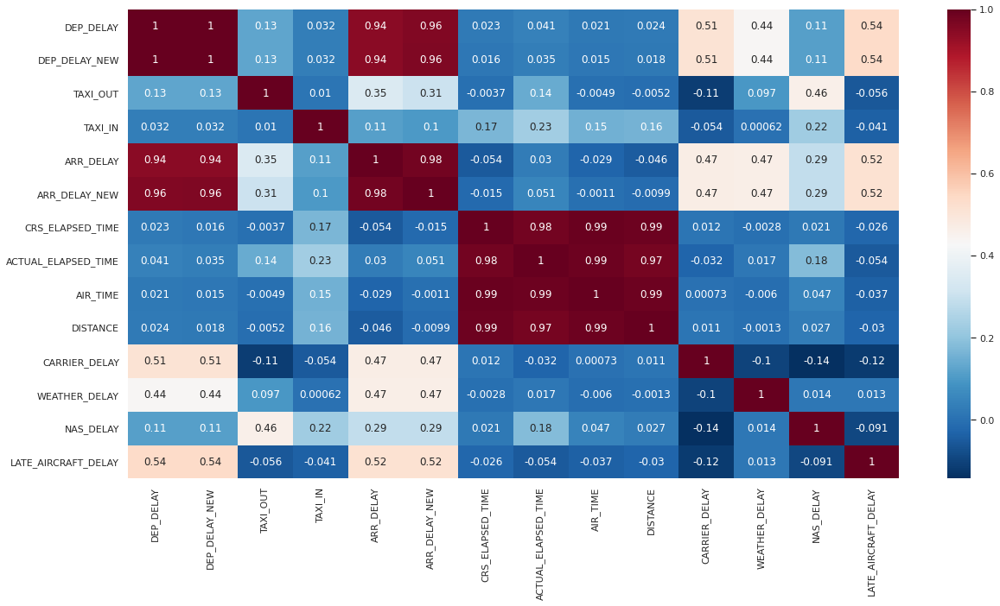

<AxesSubplot:>

In [0]:
# Heat map for numeric features
sns.set(rc={'figure.figsize':(20, 10)})
sns.heatmap(df_reduced_cols[numeric_vars_spark].corr(), cmap='RdBu_r', annot=True)

- `ARR_*` and `DEP_*` variables have high correlation with `DEP_DELAY_NEW` 
  - However, since our task is to predict delays 2 hours prior to scheduled departure time, we will not be able to count on any information obtained after departure
  - For predictions, we can only use information 2 hours before scheduled departure time
- `LATE_AIRCRAFT_DELAY`(0.56), `CARRIER_DELAY`(0.51) and `WEATHER_DELAY`(0.42) have the highest correlation with `DEP_DELAY_NEW`
  - `LATE_AIRCRAFT_DELAY` - Delay caused by previous flight
  - `CARRIER_DELAY` - Delay caused by airlines (i.e. mechanical issues)
  - `WEATHER_DELAY` - Delay caused by bad weather
  - `NAS_DELAY` - Delay caused by airport operations due to weather or congestions
- The above information may be available more than 2 hours prior to scheduled departure

Out[234]:

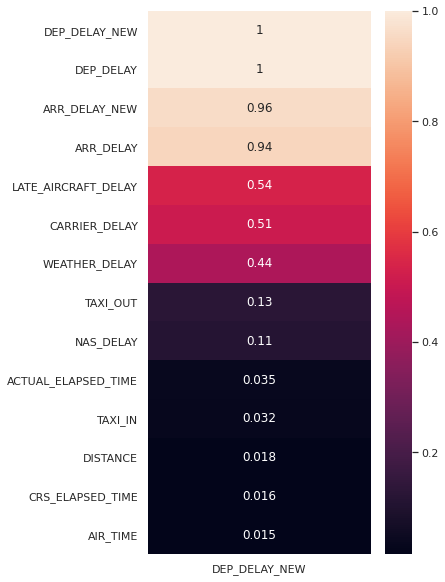

<AxesSubplot:>

In [0]:
# Sort top predictors with 'DEP_DELAY_NEW'
sns.set(rc={'figure.figsize':(5, 10)})
sns.heatmap(df_reduced_cols[numeric_vars_spark].corr()[['DEP_DELAY_NEW']].abs().sort_values(by=['DEP_DELAY_NEW'], ascending=False), annot=True)

- Check for multicollinearity on delay factors
   - No great multicollinearity between delay factors

Out[235]:

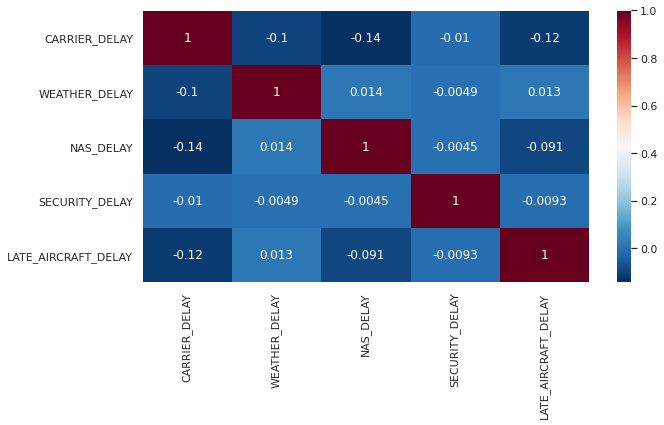

<AxesSubplot:>

In [0]:
delay_factors = ['CARRIER_DELAY','WEATHER_DELAY','NAS_DELAY','SECURITY_DELAY','LATE_AIRCRAFT_DELAY']
sns.set(rc={'figure.figsize':(10, 5)})
sns.heatmap(df_reduced_cols[delay_factors].corr(), cmap='RdBu_r', annot=True)

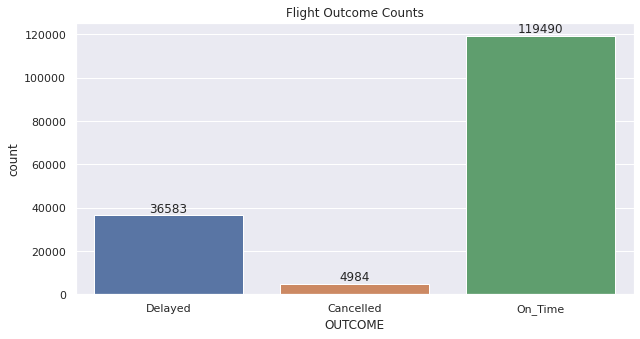

In [0]:
df_reduced_cols.loc[df_reduced_cols.DEP_DEL15 == 0, 'OUTCOME'] = 'On_Time'
df_reduced_cols.loc[df_reduced_cols.DEP_DEL15 == 1, 'OUTCOME'] = 'Delayed'
df_reduced_cols.loc[df_reduced_cols.CANCELLED == 1, 'OUTCOME'] = 'Cancelled'
ax = sns.countplot(x = df_reduced_cols.OUTCOME)
ax.bar_label(ax.containers[0]);
ax.set_title('Flight Outcome Counts');

In [0]:
main_data_reduced_cols = main_data_reduced_cols.withColumn('OUTCOME',
                                         f.when(f.col('DEP_DEL15') == 0, 'On_Time')
                                          .when(f.col('DEP_DEL15') == 1, 'Delayed')
                                          .when(f.col('CANCELLED') == 1, 'Cancelled'))
display(main_data_reduced_cols.groupBy('OUTCOME').count().sort('OUTCOME'))

OUTCOME,count
Cancelled,4826
Delayed,36685
On_Time,119546


In [0]:
# Drop cancelled flights
main_data_reduced_cols = main_data_reduced_cols.where(f.col('OUTCOME') != 'Cancelled')

#### Duplicate IDs
- Created a unique ID by combining the below:
  - `ID` - `FL_DATE`, `TAIL_NUM`, `ORIGIN`, `CRS_DEP_TIME`
  - Prevents 
- Upon unique ID creation, discovered duplicate flights
  - Some flights were cancelled and replaced by flights to a different destination
    - Remove cancelled flights and keep replacement flights
  - Some flights have same tail_num and origin but different destination
    - Remove the above as data seems suspicious

In [0]:
unique_id = main_data_reduced_cols.withColumn('ID'
                                                        , f.concat(
                                                          f.col('FL_DATE')
                                                         ,f.col('TAIL_NUM')
                                                         ,f.col('ORIGIN')
                                                         ,f.col('CRS_DEP_TIME')
                                                        ))
display(unique_id)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DIV_AIRPORT_LANDINGS,OUTCOME,ID
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,0,Delayed,2015-02-01N3MEAAORD730
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,0,On_Time,2015-02-03N3LXAAORD730
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,0,On_Time,2015-02-04N3LHAAORD730
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,820,1058,3.0,1030,1101,31.0,31.0,1.0,2,1000-1059,0.0,0.0,120.0,124.0,98.0,1.0,733.0,3,0.0,0.0,31.0,0.0,0.0,0,Delayed,2015-02-05N3LYAAORD730
2015,1,2,6,5,2015-02-06,AA,19805,AA,N3LVAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,723,-7.0,0.0,0.0,-1,0700-0759,10.0,733,1007,4.0,1030,1011,-19.0,0.0,0.0,-2,1000-1059,0.0,0.0,120.0,108.0,94.0,1.0,733.0,3,null,null,null,null,null,0,On_Time,2015-02-06N3LVAAORD730
2015,1,2,8,7,2015-02-08,AA,19805,AA,N3MAAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,728,-2.0,0.0,0.0,-1,0700-0759,10.0,738,1012,6.0,1030,1018,-12.0,0.0,0.0,-1,1000-1059,0.0,0.0,120.0,110.0,94.0,1.0,733.0,3,null,null,null,null,null,0,On_Time,2015-02-08N3MAAAORD730
2015,1,2,9,1,2015-02-09,AA,19805,AA,N3MGAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,807,37.0,37.0,1.0,2,0700-0759,15.0,822,1053,5.0,1030,1058,28.0,28.0,1.0,1,1000-1059,0.0,0.0,120.0,111.0,91.0,1.0,733.0,3,23.0,5.0,0.0,0.0,0.0,0,Delayed,2015-02-09N3MGAAORD730
2015,1,2,10,2,2015-02-10,AA,19805,AA,N3LTAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,722,-8.0,0.0,0.0,-1,0700-0759,27.0,749,1027,3.0,1030,1030,0.0,0.0,0.0,0,1000-1059,0.0,0.0,120.0,128.0,98.0,1.0,733.0,3,null,null,null,null,null,0,On_Time,2015-02-10N3LTAAORD730
2015,1,2,11,3,2015-02-11,AA,19805,AA,N3LVAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,724,-6.0,0.0,0.0,-1,0700-0759,12.0,736,1055,5.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,0.0,120.0,156.0,139.0,1.0,733.0,3,0.0,0.0,30.0,0.0,0.0,0,On_Time,2015-02-11N3LVAAORD730
2015,1,2,12,4,2015-02-12,AA,19805,AA,N3LNAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,

In [0]:
# duplicate unique_ids

unique_id_count = unique_id.groupBy('ID').count()
duplicates = unique_id_count.filter(unique_id_count['count'] > 1)

display(duplicates)
display(unique_id.where(f.col('ID') == '2015-03-11N21197ORD845'))

ID,count
2015-03-11N21197ORD845,2
2015-03-05N837ASATL912,2


YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DIV_AIRPORT_LANDINGS,OUTCOME,ID
2015,1,3,11,3,2015-03-11,EV,20366,EV,N21197,3958,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11977,1197702,31977,GRB,"Green Bay, WI",WI,55,Wisconsin,45,845,843,-2.0,0.0,0.0,-1,0800-0859,7.0,850,920,4.0,945,924,-21.0,0.0,0.0,-2,0900-0959,0.0,0.0,60.0,41.0,30.0,1.0,173.0,1,null,null,null,null,null,0,On_Time,2015-03-11N21197ORD845
2015,1,3,11,3,2015-03-11,EV,20366,EV,N21197,5815,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14696,1469606,34696,SBN,"South Bend, IN",IN,18,Indiana,42,845,1129,164.0,164.0,1.0,10,0800-0859,12.0,1141,1258,4.0,1036,1302,146.0,146.0,1.0,9,1000-1059,0.0,0.0,51.0,33.0,17.0,1.0,84.0,1,0.0,0.0,146.0,0.0,0.0,0,Delayed,2015-03-11N21197ORD845


In [0]:
# drop duplicate ids
dup_list = [x['ID'] for x in duplicates.select('ID').collect()]
unique_id2 = unique_id.filter(unique_id['ID'].isin(dup_list) == False)
unique_id2.count()

Out[241]: 156227

#### Convert to UTC Datetime
  - Airport Master: https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat
  - Timezone: https://raw.githubusercontent.com/hroptatyr/dateutils/tzmaps/iata.tzmap

In [0]:
# Airport Coordinates
airport_coord = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat', header=None)

# Rename headers
airport_coord = airport_coord.rename(columns=
                                       {0: 'AIRPORT_ID',
                                        1: 'AIRPORT_NAME',
                                        2: 'AIRPORT_CITY',
                                        3: 'AIRPORT_COUNTRY',
                                        4: 'IATA',
                                        5: 'ICAO',
                                        6: 'AIRPORT_LAT',
                                        7: 'AIRPORT_LONG',
                                        8: 'AIRPORT_ALT',
                                        9: 'AIRPORT_UTC_OFFSET',
                                        10: 'AIRPORT_DST',
                                        11: 'AIRPORT_TIMEZONE',
                                        12: 'AIRPORT_TYPE',
                                        13: 'AIRPORT_DATASOURCE'})
# Convert to spark df
airport_coord = spark.createDataFrame(airport_coord)

# Join on airport_master to airlines data based on origin
KEY_list = ['IATA', 'AIRPORT_LAT', 'AIRPORT_LONG', 'AIRPORT_TIMEZONE', 'AIRPORT_UTC_OFFSET']
airport_coord_origin = unique_id2.join(airport_coord.select('IATA', f.col('IATA').alias('IATA_ORIGIN'),
                                                            'AIRPORT_LAT', f.col('AIRPORT_LAT').alias('AIRPORT_LAT_ORIGIN'),
                                                            'AIRPORT_LONG', f.col('AIRPORT_LONG').alias('AIRPORT_LONG_ORIGIN'),
                                                            'AIRPORT_TIMEZONE', f.col('AIRPORT_TIMEZONE').alias('AIRPORT_TIMEZONE_ORIGIN'),
                                                            'AIRPORT_UTC_OFFSET', f.col('AIRPORT_UTC_OFFSET').alias('AIRPORT_UTC_OFFSET_ORIGIN')),
                                                            airport_coord.IATA == unique_id2.ORIGIN).drop(*KEY_list)
flight_data = airport_coord_origin.join(airport_coord.select('IATA', f.col('IATA').alias('IATA_DEST'),
                                                            'AIRPORT_LAT', f.col('AIRPORT_LAT').alias('AIRPORT_LAT_DEST'),
                                                            'AIRPORT_LONG', f.col('AIRPORT_LONG').alias('AIRPORT_LONG_DEST'),
                                                            'AIRPORT_TIMEZONE', f.col('AIRPORT_TIMEZONE').alias('AIRPORT_TIMEZONE_DEST'),
                                                            'AIRPORT_UTC_OFFSET', f.col('AIRPORT_UTC_OFFSET').alias('AIRPORT_UTC_OFFSET_DEST')),
                                                            airport_coord.IATA == unique_id2.DEST).drop(*KEY_list)


flight_data.display()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DIV_AIRPORT_LANDINGS,OUTCOME,ID,IATA_ORIGIN,AIRPORT_LAT_ORIGIN,AIRPORT_LONG_ORIGIN,AIRPORT_TIMEZONE_ORIGIN,AIRPORT_UTC_OFFSET_ORIGIN,IATA_DEST,AIRPORT_LAT_DEST,AIRPORT_LONG_DEST,AIRPORT_TIMEZONE_DEST,AIRPORT_UTC_OFFSET_DEST
2015,1,2,1,7,2015-02-01,AA,19805,AA,N016AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2116,11.0,11.0,0.0,0,2100-2159,12.0,2128,2252,9.0,2300,2301,1.0,1.0,0.0,0,2300-2359,0.0,0.0,115.0,105.0,84.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-01N016AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,2,1,2015-02-02,AA,19805,AA,N019AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2056,-9.0,0.0,0.0,-1,2100-2159,24.0,2120,2242,6.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,112.0,82.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-02N019AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,3,2,2015-02-03,AA,19805,AA,N008AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2058,-7.0,0.0,0.0,-1,2100-2159,19.0,2117,2243,7.0,2300,2250,-10.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,112.0,86.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-03N008AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,4,3,2015-02-04,AA,19805,AA,N024AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2057,-8.0,0.0,0.0,-1,2100-2159,23.0,2120,2245,3.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,111.0,85.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-04N024AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,6,5,2015-02-06,AA,19805,AA,N006AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2057,-8.0,0.0,0.0,-1,2100-2159,25.0,2122,2242,5.0,2300,2247,-13.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,110.0,80.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-06N006AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,7,6,2015-02-07,AA,19805,AA,N012AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2058,-7.0,0.0,0.0,-1,2100-2159,12.0,2110,2240,8.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,110.0,90.0,1.0,594.0,3,null,null,null,null,null,0,On_Time,2015-02-07N012AAATL2105,ATL,33.6367,-84.428101,America/New_York,-5,MIA,25.79319953918457,-80.29060363769531,America/New_York,-5
2015,1,2,8,7,2015-02-08,AA,19805,AA,N027AA,349,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,2105,2054,-11.0,0.0,0.0,-1,2100-2159,26.0,2120,2242,4.0,2300,2246,-14.0,0.0,0.0,-1,2300-2359,0.0,0.0,115.0,112.0,82.0,1.0,594.0,3,null,null,null,null,null,0

In [0]:
time_list = [flight_data.CRS_DEP_TIME, flight_data.ARR_TIME, flight_data.DEP_TIME, flight_data.CRS_ARR_TIME]
utc_time_list = ['CRS_DEP_TIME_UTC', 'ARR_TIME_UTC', 'DEP_TIME_UTC', 'CRS_ARR_TIME_UTC']

for time_col, utc_time_col in zip(time_list, utc_time_list):
  flight_data = flight_data.withColumn(utc_time_col, 
                       f.to_timestamp(
                         f.concat(
                           f.col('FL_DATE'),
                           f.lpad(time_col, 4, '0')
                         ), format='yyyy-MM-ddHHmm'
                       ))\
            .withColumn(utc_time_col,
                       f.to_utc_timestamp(f.col(utc_time_col), 
                                          f.when(f.lit('DEP').isin(time_col),
                                          f.col('AIRPORT_TIMEZONE_ORIGIN'))\
                                          .otherwise(f.col('AIRPORT_TIMEZONE_DEST')))
                       )
  
flight_data.select('CRS_DEP_TIME', 'CRS_DEP_TIME_UTC', 'AIRPORT_TIMEZONE_ORIGIN', 'AIRPORT_UTC_OFFSET_ORIGIN', 'CRS_ARR_TIME', 'CRS_ARR_TIME_UTC', 'AIRPORT_TIMEZONE_DEST', 'AIRPORT_UTC_OFFSET_DEST').display()

CRS_DEP_TIME,CRS_DEP_TIME_UTC,AIRPORT_TIMEZONE_ORIGIN,AIRPORT_UTC_OFFSET_ORIGIN,CRS_ARR_TIME,CRS_ARR_TIME_UTC,AIRPORT_TIMEZONE_DEST,AIRPORT_UTC_OFFSET_DEST
2105,2015-02-02T02:05:00.000+0000,America/New_York,-5,2300,2015-02-02T04:00:00.000+0000,America/New_York,-5
2105,2015-02-03T02:05:00.000+0000,America/New_York,-5,2300,2015-02-03T04:00:00.000+0000,America/New_York,-5
2105,2015-02-04T02:05:00.000+0000,America/New_York,-5,2300,2015-02-04T04:00:00.000+0000,America/New_York,-5
2105,2015-02-05T02:05:00.000+0000,America/New_York,-5,2300,2015-02-05T04:00:00.000+0000,America/New_York,-5
2105,2015-02-07T02:05:00.000+0000,America/New_York,-5,2300,2015-02-07T04:00:00.000+0000,America/New_York,-5
2105,2015-02-08T02:05:00.000+0000,America/New_York,-5,2300,2015-02-08T04:00:00.000+0000,America/New_York,-5
2105,2015-02-09T02:05:00.000+0000,America/New_York,-5,2300,2015-02-09T04:00:00.000+0000,America/New_York,-5
2105,2015-02-10T02:05:00.000+0000,America/New_York,-5,2300,2015-02-10T04:00:00.000+0000,America/New_York,-5
2105,2015-02-11T02:05:00.000+0000,America/New_York,-5,2300,2015-02-11T04:00:00.000+0000,America/New_York,-5
2105,2015-02-12T02:05:00.000+0000,America/New_York,-5,2300,2015-02-12T04:00:00.000+0000,America/New_York,-5


In [0]:
flight_data_pd_df = flight_data.toPandas()
null_values(flight_data_pd_df)

Total Number of Columns: 77
Number of Columns with Null Values: 18
Out[244]:

,Null Values,Percentage
LATE_AIRCRAFT_DELAY,121314,77.652390
CARRIER_DELAY,121314,77.652390
WEATHER_DELAY,121314,77.652390
NAS_DELAY,121314,77.652390
SECURITY_DELAY,121314,77.652390
ACTUAL_ELAPSED_TIME,539,0.345011
ARR_DELAY,539,0.345011
ARR_DELAY_NEW,539,0.345011
ARR_DEL15,539,0.345011
ARR_DELAY_GROUP,539,0.345011


In [0]:
# flight_data.select([])
from pyspark.sql.functions import concat,concat_ws,to_timestamp, to_utc_timestamp

# flight_data.select(concat_ws(' ',flight_data.FL_DATE,flight_data.DEP_TIME, flight_data.AIRPORT_TIMEZONE_ORIGIN).alias("concat"))#.display().withColumn("concat_2", to_utc_timestamp(col("concat"), col("AIRPORT_TIMEZONE_ORIGIN"))).display()

flight_data.select(concat_ws(' ',flight_data.FL_DATE,flight_data.DEP_TIME,flight_data.AIRPORT_UTC_OFFSET_ORIGIN).alias("concat")).withColumn('concat',to_timestamp("concat","yyyy-MM-dd HHmm z")).display()#.withColumn("concat_2", to_utc_timestamp(col("concat"),col("AIRPORT_TIMEZONE_ORIGIN"))).display()

#.withColumn('concat',to_timestamp("concat","yyyy-MM-dd HHmm %z")).display()
# flight_data.select(concat_ws(' ',flight_data.FL_DATE,flight_data.DEP_TIME).alias("concat")).withColumn('concat',to_timestamp("concat","yyyy-MM-dd HHmm")-flight_data.AIRPORT_UTC_OFFSET_ORIGIN).display()

concat
null
null
null
null
null
null
null
null
null
null


In [0]:
dt = datetime.strptime("21/11/06 16:30", "%d/%m/%y %H:%M")

In [0]:
# # Airport Timezone
# airport_timezone = pd.read_csv("https://raw.githubusercontent.com/hroptatyr/dateutils/tzmaps/iata.tzmap", delimiter='\t', header=None)

# # Rename headers
# airport_timezone.rename(columns={0: 'IATA_DEST', 1: 'AIRPORT_TIMEZONE_DEST'},inplace=True)

# # Convert to spark df
# airport_timezone = spark.createDataFrame(airport_timezone).union(spark.createDataFrame([['XWA', 'America/Chicago']])) # add Williston, ND airport

# # Join on airport_timezone to flight data
# # flight_data_dest = 
# flight_data.join(airport_timezone, airport_timezone.IATA == flight_data.DEST).display()
# # flight_data.display()

### Weather Data

In [0]:
# Load the 2015 Q1 for Weather
# df_weather = spark.read.parquet(f'/mnt/mids-w261/datasets_final_project/weather_data/*').filter(col('DATE') < "2015-04-01T00:00:00.000")
# display(df_weather)

# df_weather_subset = df_weather.sample(False, 0.001, seed = 1)
# df_weather_subset.write.parquet(f'{blob_url}/weather_sample_30k')

df_weather_subset = spark.read.parquet(f'{blob_url}/weather_sample_30k').cache()
display(df_weather_subset)
size = df_weather_subset.count()
print(f'Size of Weather Data: {df_weather_subset.count():,}')

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
47741099999,2015-01-15T04:00:00.000+0000,4,35.45,133.0666666,22.4,"MATSUE, JA",FM-12,99999,V020,"280,1,N,0015,1","99999,9,9,N","999999,9,9,9","+0055,1","+0049,1","10145,1",,,,,,,,,,"99999,9,10117,1","8,1,009,1,+999,9",,,,,,SYN04847741 46/// /2803 10055 20049 30117 40145 58009=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47741099999,2015-02-07T22:00:00.000+0000,4,35.45,133.0666666,22.4,"MATSUE, JA",FM-12,99999,V020,"220,1,N,0046,1","99999,9,9,N","999999,9,9,9","+0052,1","+0035,1","10138,1",,,,,,,,,,"99999,9,10110,1","8,1,002,1,+999,9",,,,,,SYN04847741 46/// /2209 10052 20035 30110 40138 58002=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47742099999,2015-01-01T02:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"250,1,N,0062,1","99999,9,9,N","000200,1,9,9","-0014,1","-0022,1","10126,1","72,1",,,,,,,,,"99999,9,10121,1","1,1,009,1,+999,9",,,,,,SYN06447742 47/02 /2512 11014 21022 30121 40126 51009 772// 555 19004=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47742099999,2015-01-09T15:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"260,1,N,0031,1","99999,9,9,N","020000,1,9,9","+0059,1","-0034,1","10179,1","00,1",,,,,,,,,"99999,9,10174,1","6,1,011,1,+999,9",,,,,,SYN05447742 47/70 /2606 10059 21034 30174 40179 56011 70060=,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"0,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,
47742099999,2015-01-10T09:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"260,1,N,0031,1","99999,9,9,N","020000,1,9,9","+0068,1","-0026,1","10206,1",,,,,,,,,,"99999,9,10201,1","3,1,013,1,+999,9",,,,,,SYN04847742 45/70 /2606 10068 21026 30201 40206 53013=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47742099999,2015-02-15T17:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"100,1,N,0005,1","99999,9,9,N","015000,1,9,9","+0029,1","+0003,1","10214,1",,,,,,,,,,"99999,9,10209,1","6,1,014,1,+999,9",,,,,,SYN04847742 45/65 /1001 10029 20003 30209 40214 56014=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47743099999,2015-01-12T04:35:00.000+0000,4,35.492222,133.236389,6.09,"MIHO, JA",FM-16,99999,V020,"320,1,N,0057,1","01067,1,9,N","009999,1,9,9","+0060,1","-0040,1","99999,9",,"02,1,+00914,1,99,9","07,1,+01067,1,99,9","07,1,+01524,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00914,1,99,9,99,9",,,"10290,1,99999,9",,"87,1",,,,,MET125SPECI RJOH 120435Z 32011KT 9999 -SHSNRAGS FEW030 BKN035 BKN050 06/M04 Q1029 RMK 1CU030 6CU035 7SC050 A3040 SNOW PELLETS=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47743099999,2015-02-11T15:00:00.000+0000,4,35.492222,133.236

Size of Weather Data: 29,818

Weather data has 8368 Unique locations, many of them outside of the united states. Because the nature of our airline data is domestic - we can quickly reduce the size of the weather dataset by removing observations from outside of the US.

In [0]:
df_weather_subset.select('Name').distinct().show(10)
cnt_distinct = df_weather_subset.select(f.col('Name')).distinct().count()
print(f'Number of distinct weather stations: {cnt_distinct}')

+--------------------+
 Name|
+--------------------+
 MAIZURU, JA|
 SAN FERNANDO, AR|
 TOYOOKA, JA|
 SAKAI, JA|
 TOTTORI, JA|
 MIHO, JA|
 GENERAL PICO, AR|
 YONAGO, JA|
MINISTRO PISTARIN...|
 TAJIMA, JA|
+--------------------+
only showing top 10 rows

Number of distinct weather stations: 8368

All of these names don't appear to follow the same format. For example, the above list in Japan appears to be City, country. Initial split `df_weather_subset.withColumn('Country', f.split(df_weather_subset['Name'], ',').getItem(1))` assuming this was true for all records was incorrect, as records are represented as 'City, ST Country'. Instead of splitting, we filter to all of the `Name`s ending with "US". This reduced the amount of weather stations from 8300+ to 2278, and total rows from the quarter by %.

In [0]:
df_weather_subset_US = df_weather_subset.filter(f.col('Name').endswith('US'))
print('count of US weatherstations', df_weather_subset_US.select(f.col('Name')).distinct().count())
print(df_weather_subset.count())
print(df_weather_subset_US.count())

count of US weatherstations 2278
29818
13980

In [0]:
df_weather_subset.printSchema()

root
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- SOURCE: short (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- QUALITY_CONTROL: string (nullable = true)
-- WND: string (nullable = true)
-- CIG: string (nullable = true)
-- VIS: string (nullable = true)
-- TMP: string (nullable = true)
-- DEW: string (nullable = true)
-- SLP: string (nullable = true)
-- AW1: string (nullable = true)
-- GA1: string (nullable = true)
-- GA2: string (nullable = true)
-- GA3: string (nullable = true)
-- GA4: string (nullable = true)
-- GE1: string (nullable = true)
-- GF1: string (nullable = true)
-- KA1: string (nullable = true)
-- KA2: string (nullable = true)
-- MA1: string (nullable = true)
-- MD1: string (nullable = true)
-- MW1: string (nullable = true)
-- MW2: string (nullable = true)
-- OC1: string (nullable = true)
-- OD1: string (nullable = true)
-- OD2: string (nullable = true)
-- REM: string (nullable = true)
-- EQD: string (nullable = true)
-- AW2: string (nullable = true)
-- AX4: string (nullable = true)
-- GD1: string (nullable = true)
-- AW5: string (nullable = true)
-- GN1: string (nullable = true)
-- AJ1: string (nullable = true)
-- AW3: string (nullable = true)
-- MK1: string (nullable = true)
-- KA4: string (nullable = true)
-- GG3: string (nullable = true)
-- AN1: string (nullable = true)
-- RH1: string (nullable = true)
-- AU5: string (nullable = true)
-- HL1: string (nullable = true)
-- OB1: string (nullable = true)
-- AT8: string (nullable = true)
-- AW7: string (nullable = true)
-- AZ1: string (nullable = true)
-- CH1: string (nullable = true)
-- RH3: string (nullable = true)
-- GK1: string (nullable = true)
-- IB1: string (nullable = true)
-- AX1: string (nullable = true)
-- CT1: string (nullable = true)
-- AK1: string (nullable = true)
-- CN2: string (nullable = true)
-- OE1: string (nullable = true)
-- MW5: string (nullable = true)
-- AO1: string (nullable = true)
-- KA3: string (nullable = true)
-- AA3: string (nullable = true)
-- CR1: string (nullable = true)
-- CF2: string (nullable = true)
-- KB2: string (nullable = true)
-- GM1: string (nullable = true)
-- AT5: string (nullable = true)
-- AY2: string (nullable = true)
-- MW6: string (nullable = true)
-- MG1: string (nullable = true)
-- AH6: string (nullable = true)
-- AU2: string (nullable = true)
-- GD2: string (nullable = true)
-- AW4: string (nullable = true)
-- MF1: string (nullable = true)
-- AA1: string (nullable = true)
-- AH2: string (nullable = true)
-- AH3: string (nullable = true)
-- OE3: string (nullable = true)
-- AT6: string (nullable = true)
-- AL2: string (nullable = true)
-- AL3: string (nullable = true)
-- AX5: string (nullable = true)
-- IB2: string (nullable = true)
-- AI3: string (nullable = true)
-- CV3: string (nullable = true)
-- WA1: string (nullable = true)
-- GH1: string (nullable = true)
-- KF1: string (nullable = true)
-- CU2: string (nullable = true)
-- CT3: string (nullable = true)
-- SA1: string (nullable = true)
-- AU1: string (nullable = true)
-- KD2: string (nullable = true)
-- AI5: string (nullable = true)
-- GO1: string (nullable = true)
-- GD3: string (nullable = true)
-- CG3: string (nullable = true)
-- AI1: string (nullable = true)
-- AL1: string (nullable = true)
-- AW6: string (nullable = true)
-- MW4: string (nullable = true)
-- AX6: string (nullable = true)
-- CV1: string (nullable = true)
-- ME1: string (nullable = true)
-- KC2: string (nullable = true)
-- CN1: string (nullable = true)
-- UA1: string (nullable = true)
-- GD5: string (nullable = true)
-- UG2: string (nullable = true)
-- AT3: string (nullable = true)
-- AT4: string (nullable = true)
-- GJ1: string (nullable = true)
-- MV1: string (nullable = true)
-- GA5: string (nullable = true)
-- CT2: string (nullable = true)
-- CG2: string

In [0]:
df = df_weather_subset.toPandas()
weather_null_df = null_values(df)

weather_null_df

Total Number of Columns: 177
Number of Columns with Null Values: 164
Out[14]:

,Null Values,Percentage
GG2,29818,100.000000
AX6,29818,100.000000
AA4,29818,100.000000
GK1,29818,100.000000
MW6,29818,100.000000
...,...,...
MA1,6739,22.600443
REM,3997,13.404655
SOURCE,3989,13.377825
NAME,236,0.791468


In [0]:
weather_null_df[weather_null_df.Percentage > 60]

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-1693703998023732> in <module> 
 ----> 1 weather_null_df [ weather_null_df . Percentage > 60 ] 

 NameError : name 'weather_null_df' is not defined

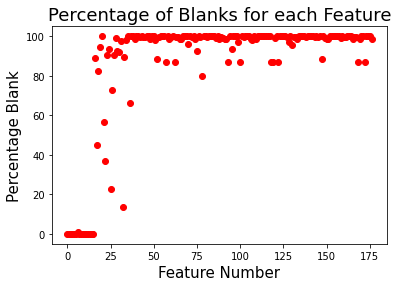

In [0]:
blank_dict = {}

# Find empty values
for field in df_weather_subset.columns:
  blank_dict[field] = df_weather_subset.select(field).where(f.col(field) == '').count()  

blank_df = pd.DataFrame([blank_dict])/size*100

# Plot
p_transpose = blank_df.T.values
plt.plot(p_transpose,'ro');
plt.title('Percentage of Blanks for each Feature',fontsize=18);
plt.xlabel('Feature Number',fontsize=15);
plt.ylabel('Percentage Blank', fontsize=15);

In [0]:
# Decoding weather condition from NOAA
# https://www.ncei.noaa.gov/data/global-hourly/doc/isd-format-document.pdf
# Wind params page 8-9
# Cloud params page 9
# Visibility params page 10
# Temperature page 10-11
# Dew point temperature page 11
# Pressure page 12

def weather_decode(df):
  WND = f.split(df['WND'], ',')
  CIG = f.split(df['CIG'], ',')
  VIS = f.split(df['VIS'], ',')
  TMP = f.split(df['TMP'], ',')
  DEW = f.split(df['DEW'], ',')
  SLP = f.split(df['SLP'], ',') 
  df = (df
        # WND
        .withColumn('WND_DIRECTION_ANGLE', WND.getItem(0).cast('int')) # numeric
        .withColumn('WND_QUALITY_CODE', WND.getItem(1).cast('int')) # categorical
        .withColumn('WND_TYPE_CODE', WND.getItem(2).cast('string')) # categorical
        .withColumn('WND_SPEED_RATE', WND.getItem(3).cast('int')) # categorical
        .withColumn('WND_SPEED_QUALITY_CODE', WND.getItem(4).cast('int')) # categorical
        
        # CIG
        .withColumn('CIG_CEILING_HEIGHT_DIMENSION', CIG.getItem(0).cast('int')) # numeric 
        .withColumn('CIG_CEILING_QUALITY_CODE', CIG.getItem(1).cast('int')) # categorical
        .withColumn('CIG_CEILING_DETERMINATION_CODE', CIG.getItem(2).cast('string')) # categorical 
        .withColumn('CIG_CAVOK_CODE', CIG.getItem(3).cast('string')) # categorical/binary
        
        # VIS Fields
        .withColumn('VIS_DISTANCE_DIMENSION', VIS.getItem(0).cast('int')) # numeric
        .withColumn('VIS_DISTANCE_QUALITY_CODE', VIS.getItem(1).cast('int')) # categorical
        .withColumn('VIS_VARIABILITY_CODE', VIS.getItem(2).cast('string')) # categorical/binary
        .withColumn('VIS_QUALITY_VARIABILITY_CODE', VIS.getItem(3).cast('int')) # categorical
        
        # TMP
        .withColumn('TMP_AIR_TEMP', TMP.getItem(0).cast('int')) # numeric
        .withColumn('TMP_AIR_TEMP_QUALITY_CODE', TMP.getItem(1).cast('string')) # categorical
        
        # DEW
        .withColumn('DEW_POINT_TEMP', DEW.getItem(0).cast('int')) # numeric
        .withColumn('DEW_POINT_QUALITY_CODE', DEW.getItem(1).cast('string')) # categorical
        
        # SLP
        .withColumn('SLP_SEA_LEVEL_PRES', SLP.getItem(0).cast('int')) # numeric
        .withColumn('SLP_SEA_LEVEL_PRES_QUALITY_CODE', SLP.getItem(1).cast('int')) # categorical
       )
  
  return df

In [0]:
df_weather_subset_decoded = weather_decode(df_weather_subset)
display(df_weather_subset_decoded)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,WND_DIRECTION_ANGLE,WND_QUALITY_CODE,WND_TYPE_CODE,WND_SPEED_RATE,WND_SPEED_QUALITY_CODE,CIG_CEILING_HEIGHT_DIMENSION,CIG_CEILING_QUALITY_CODE,CIG_CEILING_DETERMINATION_CODE,CIG_CAVOK_CODE,VIS_DISTANCE_DIMENSION,VIS_DISTANCE_QUALITY_CODE,VIS_VARIABILITY_CODE,VIS_QUALITY_VARIABILITY_CODE,TMP_AIR_TEMP,TMP_AIR_TEMP_QUALITY_CODE,DEW_POINT_TEMP,DEW_POINT_QUALITY_CODE,SLP_SEA_LEVEL_PRES,SLP_SEA_LEVEL_PRES_QUALITY_CODE
47741099999,2015-01-15T04:00:00.000+0000,4,35.45,133.0666666,22.4,"MATSUE, JA",FM-12,99999,V020,"280,1,N,0015,1","99999,9,9,N","999999,9,9,9","+0055,1","+0049,1","10145,1",,,,,,,,,,"99999,9,10117,1","8,1,009,1,+999,9",,,,,,SYN04847741 46/// /2803 10055 20049 30117 40145 58009=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,280,1,N,15,1,99999,9,9,N,999999,9,9,9,55,1,49,1,10145,1
47741099999,2015-02-07T22:00:00.000+0000,4,35.45,133.0666666,22.4,"MATSUE, JA",FM-12,99999,V020,"220,1,N,0046,1","99999,9,9,N","999999,9,9,9","+0052,1","+0035,1","10138,1",,,,,,,,,,"99999,9,10110,1","8,1,002,1,+999,9",,,,,,SYN04847741 46/// /2209 10052 20035 30110 40138 58002=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,220,1,N,46,1,99999,9,9,N,999999,9,9,9,52,1,35,1,10138,1
47742099999,2015-01-01T02:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"250,1,N,0062,1","99999,9,9,N","000200,1,9,9","-0014,1","-0022,1","10126,1","72,1",,,,,,,,,"99999,9,10121,1","1,1,009,1,+999,9",,,,,,SYN06447742 47/02 /2512 11014 21022 30121 40126 51009 772// 555 19004=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,250,1,N,62,1,99999,9,9,N,200,1,9,9,-14,1,-22,1,10126,1
47742099999,2015-01-09T15:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"260,1,N,0031,1","99999,9,9,N","020000,1,9,9","+0059,1","-0034,1","10179,1","00,1",,,,,,,,,"99999,9,10174,1","6,1,011,1,+999,9",,,,,,SYN05447742 47/70 /2606 10059 21034 30174 40179 56011 70060=,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"0,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,260,1,N,31,1,99999,9,9,N,20000,1,9,9,59,1,-34,1,10179,1
47742099999,2015-01-10T09:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"260,1,N,0031,1","99999,9,9,N","020000,1,9,9","+0068,1","-0026,1","10206,1",,,,,,,,,,"99999,9,10201,1","3,1,013,1,+999,9",,,,,,SYN04847742 45/70 /2606 10068 21026 30201 40206 53013=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,260,1,N,31,1,99999,9,9,N,20000,1,9,9,68,1,-26,1,10206,1
47742099999,2015-02-15T17:00:00.000+0000,4,35.55,133.2333333,3.8,"SAKAI, JA",FM-12,99999,V020,"100,1,N,0005,1","99999,9,9,N","015000,1,9,9","+0029,1","+0003,1","10214,1",,,,,,,,,,"99999,9,10209,1","6,1,014,1,+999,9",,,,,,SYN04847742 45/65 /1001 10029 20003 30209 40214 56014=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [0]:
# Drop columns with more than 50% null values as these will be hard to impute
drop_columns_list = weather_null_df[weather_null_df.Percentage > 50].index.values.tolist()
drop_columns_list

# Consider dropping GA1 bc we have CIG, drop 

Out[123]: ['GG2',
 'AX6',
 'AA4',
 'GK1',
 'MW6',
 'WD1',
 'AW7',
 'HL1',
 'AU5',
 'GG3',
 'AL2',
 'AL3',
 'AX5',
 'AW5',
 'AK1',
 'AW6',
 'MW5',
 'GD5',
 'UG1',
 'GL1',
 'GG4',
 'MV2',
 'GA6',
 'AU4',
 'GG1',
 'AM1',
 'UG2',
 'GJ1',
 'AX4',
 'AT8',
 'AT6',
 'MW4',
 'AT7',
 'AI1',
 'AH6',
 'AI5',
 'AI3',
 'AI4',
 'AD1',
 'AI6',
 'AH1',
 'AH3',
 'MH1',
 'AW4',
 'AH2',
 'AI2',
 'MK1',
 'AH5',
 'AH4',
 'IA2',
 'KD1',
 'AB1',
 'MW3',
 'KB1',
 'KE1',
 'AE1',
 'KB3',
 'GA5',
 'AX3',
 'KC2',
 'KD2',
 'KC1',
 'KB2',
 'AT5',
 'AU3',
 'IB1',
 'MV1',
 'GO1',
 'GN1',
 'GM1',
 'SA1',
 'AT4',
 'AX2',
 'UA1',
 'AW3',
 'AX1',
 'GA4',
 'AT3',
 'CN4',
 'AN1',
 'GD4',
 'RH2',
 'KG2',
 'KG1',
 'RH1',
 'MF1',
 'RH3',
 'AT2',
 'KA4',
 'WA1',
 'KA3',
 'OD3',
 'AA3',
 'AL1',
 'AT1',
 'MG1',
 'OE3',
 'OE2',
 'OE1',
 'IA1',
 'MW2',
 'ED1',
 'CF3',
 'CI1',
 'GH1',
 'IB2',
 'CU3',
 'CF1',
 'CR1',
 'CN3',
 'CU1',
 'CV1',
 'CV3',
 'KF1',
 'CU2',
 'CF2',
 'CN2',
 'CV2',
 'CN1',
 'AU2',
 'AJ1',
 'OB1',
 'AZ2',
 'AW2',
 'AZ1',
 'ME1',
 'OD2',
 'GD3',
 'AA2',
 'AY2',
 'AY1',
 'GA3',
 'AU1',
 'KA2',
 'OC1',
 'GD2',
 'OD1',
 'KA1',
 'MW1',
 'EQD',
 'AW1',
 'CH1',
 'CB1',
 'CT3',
 'CW1',
 'CG3',
 'CT1',
 'CG1',
 'CT2',
 'CG2',
 'AO1',
 'CO1',
 'GA2',
 'AA1',
 'MD1',
 'GD1',
 'GE1']

In [0]:
# Reduced columns in Spark df
unmeaningful_cols = ['SOURCE', 'CALL_SIGN', 'QUALITY_CONTROL', 'GA1', 'GF1', 'MA1', 'REM']
df_weather_subset_decoded_reduced_cols = df_weather_subset_decoded.drop(*drop_columns_list
                                                                        + ['WND',
                                                                           'CIG',
                                                                           'VIS',
                                                                           'TMP',
                                                                           'DEW',
                                                                           'SLP'
                                                                          ] + unmeaningful_colsunmeaningful_cols
                                                                       )
df_weather_subset_decoded_reduced_cols.columns

Out[124]: ['STATION',
 'DATE',
 'LATITUDE',
 'LONGITUDE',
 'ELEVATION',
 'NAME',
 'REPORT_TYPE',
 'WND_DIRECTION_ANGLE',
 'WND_QUALITY_CODE',
 'WND_TYPE_CODE',
 'WND_SPEED_RATE',
 'WND_SPEED_QUALITY_CODE',
 'CIG_CEILING_HEIGHT_DIMENSION',
 'CIG_CEILING_QUALITY_CODE',
 'CIG_CEILING_DETERMINATION_CODE',
 'CIG_CAVOK_CODE',
 'VIS_DISTANCE_DIMENSION',
 'VIS_DISTANCE_QUALITY_CODE',
 'VIS_VARIABILITY_CODE',
 'VIS_QUALITY_VARIABILITY_CODE',
 'TMP_AIR_TEMP',
 'TMP_AIR_TEMP_QUALITY_CODE',
 'DEW_POINT_TEMP',
 'DEW_POINT_QUALITY_CODE',
 'SLP_SEA_LEVEL_PRES',
 'SLP_SEA_LEVEL_PRES_QUALITY_CODE']

### Subsetting the data further to only include US weather stations

This sample (.1%) of the total weather data has 8368 Unique locations, many of them outside of the united states. Because the nature of our airline data is domestic - we can quickly reduce the size of the weather dataset by removing observations from outside of the US.

All of these names don't appear to follow the same format. For example, the above list in Japan appears to be City, country. Initial split `df_weather_subset.withColumn('Country', f.split(df_weather_subset['Name'], ',').getItem(1))` assuming this was true for all records was incorrect, as records are represented as 'City, ST Country'. Instead of splitting, we filter to all of the Names ending with "US". This reduced the amount of weather stations by about 25%. 

Next, we will quickly convert our spark dataframe to pandas for some graphical EDA.

In [0]:
weather_US = df_weather_subset_decoded_reduced_cols.filter(f.col('Name').endswith('US'))
weather_eda = weather_US.toPandas()


### Descriptive EDA for remaining Features
Following removal of features with disproportionate representation of nulls, we dig further into our remaining features to understand data quality. We know from [previous eda on a larger version of this data](https://adb-731998097721284.4.azuredatabricks.net/?o=731998097721284#notebook/1038316885900748/command/1038316885900784) that the below columns do not contain any 'Null', blanks, or NaNs, but are there other 'codes' used to represent missing data? We can quickly see from our set of histograms (and references in the codebook) that this dataset commonly leverages some versoin of repeating 9's as a missing data indicator. 

Features without any 'traditional' Null values: 
- Date
- Latitude
- Longitude
- Elevation
- WND
- CIG
- VIS
- TMP
- DEW
- SLP

In [0]:
import math

def histograms(df_in, variables = []):
    if len(variables) == 0:
        variables = df_in.columns
    chart_size = math.ceil(len(variables)**.5)
        
    fig = plt.figure(figsize = (20, 20))

    for i, var in enumerate(variables):
        ax = fig.add_subplot(chart_size, chart_size, i+1)
        ax.set_title(var + '\n max value:' + str(max(df_in[var])))
        df_in[var].hist(ax = ax)
    fig.tight_layout()
    plt.show()


In [0]:
weather_US.printSchema()

root
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- WND_DIRECTION_ANGLE: integer (nullable = true)
-- WND_QUALITY_CODE: integer (nullable = true)
-- WND_TYPE_CODE: string (nullable = true)
-- WND_SPEED_RATE: integer (nullable = true)
-- WND_SPEED_QUALITY_CODE: integer (nullable = true)
-- CIG_CEILING_HEIGHT_DIMENSION: integer (nullable = true)
-- CIG_CEILING_QUALITY_CODE: integer (nullable = true)
-- CIG_CEILING_DETERMINATION_CODE: string (nullable = true)
-- CIG_CAVOK_CODE: string (nullable = true)
-- VIS_DISTANCE_DIMENSION: integer (nullable = true)
-- VIS_DISTANCE_QUALITY_CODE: integer (nullable = true)
-- VIS_VARIABILITY_CODE: string (nullable = true)
-- VIS_QUALITY_VARIABILITY_CODE: integer (nullable = true)
-- TMP_AIR_TEMP: integer (nullable = true)
-- TMP_AIR_TEMP_QUALITY_CODE: string (nullable = true)
-- DEW_POINT_TEMP: integer (nullable = true)
-- DEW_POINT_QUALITY_CODE: string (nullable = true)
-- SLP_SEA_LEVEL_PRES: integer (nullable = true)
-- SLP_SEA_LEVEL_PRES_QUALITY_CODE: integer (nullable = true)

First, we need to separate out numerical and non-numerical features, as our research will flow a bit differently here.

In [0]:

# Separating numeric and non-numeric Columns
feat_types = weather_eda.dtypes
non_num_feats = feat_types[(feat_types != 'float64') & (feat_types != 'int32')].index
num_feats = feat_types.index.drop(non_num_feats)

We can use these histograms as a first look at some of the different codes that are used to represent missing values. For example, `WND_DIRECTION_ANGLE` uses '999', whereas `WND_SPEED_RATE` uses '9999'. 

Here, we are specifically interested in both identifying the 'missing' code, as well as understanding what portion of each feature contains missing data. this will further influence whether we drop observations, treat observations, or drop further features. Description of each of our numerical variables is included below. 

`LATITUDE` (double): Latitude coordinates
- Missing = 999999 (none missing in sample)
- Range = (-90000, 90000)
- Scaling Factor = 1000

`LONGITUDE` (double): Longitude coordinates
- Missing = 999999 (none missing in sample)
- Range = (-90000, 90000)
- Scaling Factor = 1000

`ELEVATION` (double): The elevation of a geophysical-point-observation relative to Mean Sea Level (MSL).
- Missing = 9999 (none missing in sample)
- Range = (-0400, 8850)
- Scaling Factor = 1

**WND** Derivatives - Transformed

`WND_DIRECTION_ANGLE`: The angle, measured in a clockwise direction, between true north and the direction from which the wind is blowing.
- Missing = 999 (% Missing in sample)
- Range = (001, 360)
- Scaling Factor = 1

`WND_SPEED_RATE`: The rate of horizontal travel of air past a fixed point.
- Missing = 9999
- Range = (0000, 0900), categorical - See code book pg 8 for category definitions
- Units: meters per second
- Scaling Factor = 10

**CIG** Derivatives - Transformed

`CIG_CEILING_HEIGHT_DIMENSION`: The height above ground level (AGL) of the lowest cloud or obscuring phenomena layer aloft with 5/8 or more summation total sky cover, which may be predominantly opaque, or the vertical visibility into a surface-based obstruction. 
- Missing = 99999 (% Missing in sample)
- Range = (00000, 22000)
- Units = meters
- Scaling Factor = 1

**VIS** Derivatives - Transformed

`VIS_DISTANCE DIMENSION`: The horizontal distance at which an object can be seen and identified
- Missing = 999999 (% Missing in sample)
- Range = (000000, 160000) - values greater than 160000 entered as 160000
- Units = meters
- Scaling Factor = 1

`VIS_QUALITY_VARIABILITY_CODE`: The code that denotes whether or not the reported visibility is variable.
- Missing = 9 (% Missing in sample)
- Range = (000000, 160000) - values greater than 160000 entered as 160000
- Units = meters
- Scaling Factor = 1

**TMP** Derivatives - Transformed

`TMP_AIR_TEMP`: The temperature of the air.
- Missing = 9999 (% Missing in sample)
- Range = (-0932, 0618) - values greater than 160000 entered as 160000
- Units = Degrees Celsius
- Scaling Factor = 10

**DEW** Derivatives - Transformed

`DEW_POINT_TEMP`: The temperature to which a given parcel of air must be cooled at constant pressure and water vapor content in order for saturation to occur.
- Missing = 9999 (% Missing in sample)
- Range = (-0932, 0368) - values greater than 160000 entered as 160000
- Units = Degrees Celsius
- Scaling Factor = 10

**SLP** Derivatives - Transformed

`SLP_SEA_LEVEL_PRES`: The air pressure relative to Mean Sea Level (MSL).
- Missing = 99999 (% Missing in sample)
- Range = (08600, 10900) - values greater than 160000 entered as 160000
- Units = Hectopascals
- Scaling Factor = 10

`_QUALITY_CODE`s: denotes the quality status of a given measure
- 0 = Passed gross limits check
- 1 = Passed all quality control checks
- **2 = Suspect**
- **3 = Erroneous**
- 4 = Passed gross limits check, data originate from an NCEI data source
- 5 = Passed all quality control checks, data originate from an NCEI data source 6 = Suspect, data originate from an NCEI data source
- **7 = Erroneous, data originate from an NCEI data source**
- 9 = Passed gross limits check if element is present

- Note: 2, 3, and 7 should be used in conjunction with missing codes to either impute or remove datapoints

In [0]:
features = ['LATITUDE', 'LONGITUDE', 'ELEVATION', 'WND_DIRECTION_ANGLE', 'WND_SPEED_RATE', 'CIG_CEILING_HEIGHT_DIMENSION', 'VIS_DISTANCE_DIMENSION', 'VIS_QUALITY_VARIABILITY_CODE', 'TMP_AIR_TEMP', 'DEW_POINT_TEMP', 'SLP_SEA_LEVEL_PRES']
missing_codes = [999999, 999999, 9999, 999, 9999, 99999, 999999, 9, 9999, 9999, 99999]

missing_pct = []
for i, feat in enumerate(features): 
    pct = len(weather_eda[weather_eda[feat] == missing_codes[i]])/len(weather_eda)
    missing_pct.append(pct)
    
missing_pct



pd.DataFrame(missing_pct, index = features)

Out[182]:

,0
LATITUDE,0.000000
LONGITUDE,0.000000
ELEVATION,0.000000
WND_DIRECTION_ANGLE,0.436266
WND_SPEED_RATE,0.266309
CIG_CEILING_HEIGHT_DIMENSION,0.309442
VIS_DISTANCE_DIMENSION,0.300429
VIS_QUALITY_VARIABILITY_CODE,0.344063
TMP_AIR_TEMP,0.018026
DEW_POINT_TEMP,0.295994


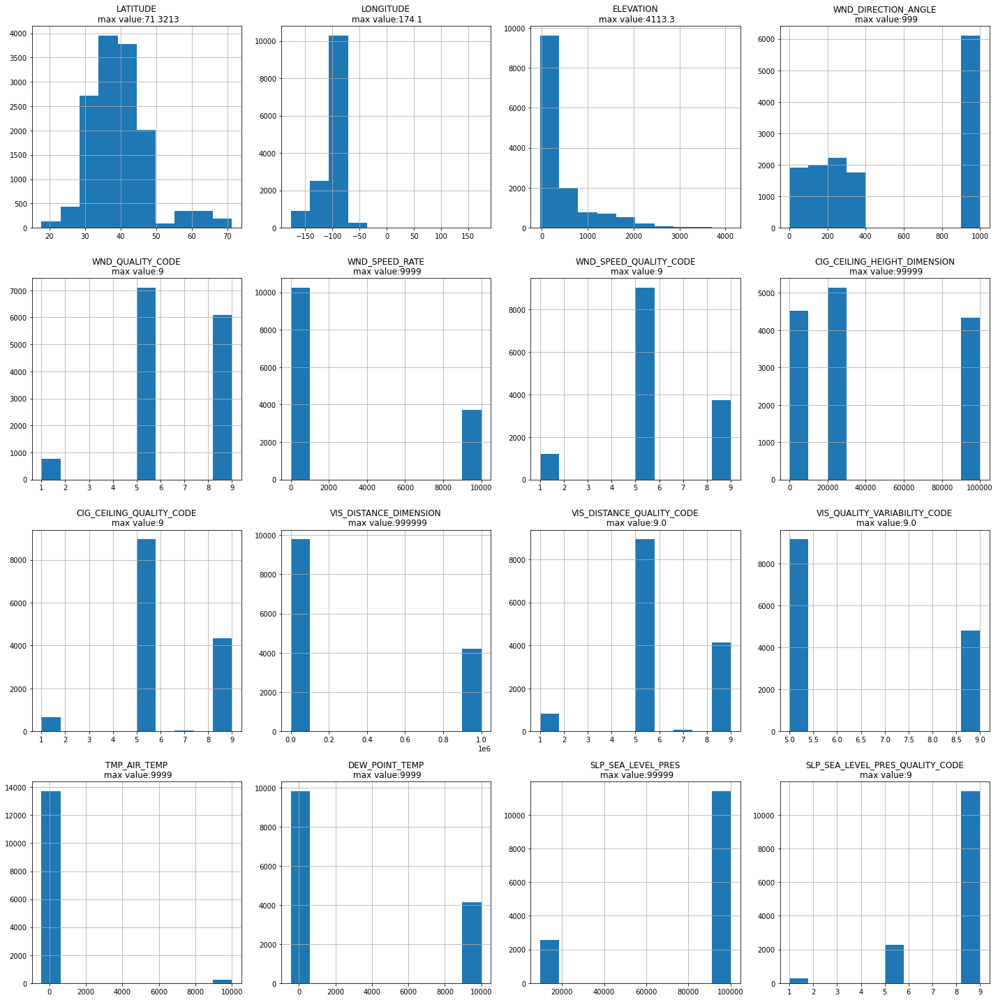

In [0]:
histograms(weather_eda, num_feats)

In [0]:
categorical_feats = non_num_feats[3:]
for feat in categorical_feats:
    print('Categorical Feature: ' + feat)
    print(weather_eda[feat].value_counts()/weather_eda[feat].count())
    print('---------------------------------')


Categorical Feature: REPORT_TYPE
FM-15 0.649857
CRN05 0.274249
FM-16 0.057082
SOD 0.010730
FM-12 0.007225
SHEF 0.000501
SOM 0.000215
SURF 0.000143
Name: REPORT_TYPE, dtype: float64
---------------------------------
Categorical Feature: WND_TYPE_CODE
N 0.553863
9 0.259800
C 0.139342
R 0.021459
V 0.017883
H 0.007654
Name: WND_TYPE_CODE, dtype: float64
---------------------------------
Categorical Feature: CIG_CEILING_DETERMINATION_CODE
9 0.700644
M 0.289342
W 0.009800
C 0.000215
Name: CIG_CEILING_DETERMINATION_CODE, dtype: float64
---------------------------------
Categorical Feature: CIG_CAVOK_CODE
N 0.989342
9 0.010658
Name: CIG_CAVOK_CODE, dtype: float64
---------------------------------
Categorical Feature: VIS_VARIABILITY_CODE
N 0.651788
9 0.344063
V 0.004149
Name: VIS_VARIABILITY_CODE, dtype: float64
---------------------------------
Categorical Feature: TMP_AIR_TEMP_QUALITY_CODE
5 0.557296
1 0.332833
C 0.089700
9 0.018026
6 0.001502
7 0.000501
A 0.000143
Name: TMP_AIR_TEMP_QUALITY_CODE, dtype: float64
---------------------------------
Categorical Feature: DEW_POINT_QUALITY_CODE
5 0.556009
9 0.295994
C 0.089199
1 0.058011
7 0.000501
A 0.000143
6 0.000143
Name: DEW_POINT_QUALITY_CODE, dtype: float64
---------------------------------

Following EDA

### Stations Data

In [0]:
df_stations = spark.read.parquet('/mnt/mids-w261/datasets_final_project/stations_data/*').cache()
display(df_stations)

In [0]:
df_stations.count()